In [1]:
import sys
sys.path.append("../")

%load_ext autoreload
%autoreload 2


In [2]:
import json
import numpy as np
from tqdm.notebook import trange, tqdm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
import pickle
import re
from collections import defaultdict
from features import merge_entries
from utills import chunker
from sklearn.preprocessing import normalize
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from fit_reddit_topic_models import preprocess_for_topics, noop
from train_utils import generate_doc_pairs_no_chunking
import tikzplotlib
import gzip

import matplotlib.style as style
from matplotlib import rcParams
%matplotlib notebook

In [3]:
from plotly.offline import init_notebook_mode
import plotly.offline as py
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [4]:
PREPROCESSED_DATA_PATH = '../temp_data/reddit_old_dec/preprocessed/'
CLASSIFIER_MODEL_DIR = '../temp_data/reddit_old_dec/unchunked/'
TEMP_DATA_PATH = '../temp_data/reddit_old_dec/topic_similarity/'
FIGURES_PATH = '../figures/'

Load Topic Model
===

In [5]:
# Fit the model using fit_reddit_topic_models.py
with open('../temp_data/reddit/topic_similarity/reddit_topic_model_chunked3.p', 'rb') as f:
    (nmf, transformer) = pickle.load(f)

In [6]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [7]:
display_topics(nmf, transformer.get_feature_names(), 20)

Topic 0:
’ s ve ll re t let doesn isn yeah thing seen true wasn sure point thought makes — weird
Topic 1:
" word say says they're can't words oh there's no called call means name we're hey real phrase let's kind
Topic 2:
* intensifies laughs noises oh c cough ah a no — cries edit wait nbsp hugs starts sigh hey eyes
Topic 3:
she herself wants does said mom told show woman knows wanted needs wife asked knew thinks pregnant married says baby
Topic 4:
life feel yourself help things relationship friends someone talk try need person find something take work friend myself tell feeling
Topic 5:
girl guy girls guys friends friend school date dick someone talk dating ask like say attractive girlfriend crush boy boys
Topic 6:
URL source link here's article check found ] edit posted page links list find thread website sources twitter version site
Topic 7:
e n l h g p s y t b m k w c v a j o x z
Topic 8:
] [ source response talk sauce drawn removed mana — creature ): edit commander – there's creatu

Load model and prediction data
===

In [65]:
with open(CLASSIFIER_MODEL_DIR + 'experiment_data_2.p', 'rb') as f:
    (author_to_doc_idx, 
        author_to_doc_idx_test, 
        author_subreddit, 
        author_subreddit_test, 
        x_shape, 
        x_shape_test,
        X_idxs_train,
        Y_train,
        X_idxs_test,
        Y_test
    )= pickle.load(f)

Compute User Topic Models
===

In [8]:
nmf.verbose = 0

In [66]:
i = 0
X = np.zeros((len(author_to_doc_idx_test), nmf.n_components))
zeros = 0
with open(PREPROCESSED_DATA_PATH + 'test.jsonl', 'r') as f:
    for l in tqdm(f, total=len(author_to_doc_idx_test)):
        d = json.loads(l)
        if d['username'] not in author_to_doc_idx_test.keys():
            continue
        prepped = [preprocess_for_topics(merge_entries(c)) for c in chunker(d['data'], 20)]
        prepped = [c for c in prepped if len(c) > 0]
        if len(prepped) > 0:
            x = normalize(nmf.transform(transformer.transform(prepped)))
            x = x.mean(axis=0)
        else:
            x = np.zeros(nmf.n_components)
            zeros += 1
#         prepped = preprocess_for_topics(merge_entries(d['data']))
#         x = normalize(nmf.transform(transformer.transform([prepped])))[0]
        X[author_to_doc_idx_test[d['username']], :] = x

In [32]:
len(prepped)

3

In [29]:
X[author_to_doc_idx_test[d['username']], :]ape

(150,)

In [9]:
with open(TEMP_DATA_PATH + 'computed_topic_models_2.p', 'wb') as f:
    pickle.dump(X, f)


Compute Similarities
=====

In [67]:
similarities = np.array([
    1 - cosine(X[i, :], X[j, :])
    for i, j in X_idxs_test
])

Topic Similarity Distributions
====

In [68]:
fig = go.Figure()
fig.add_trace(go.Histogram(
        x=similarities[Y_test==True],
        name='Same Author'
    ))
fig.add_trace(go.Histogram(
        x=similarities[Y_test==False],
        name='Diff Author'
    ))


fig.show()

In [11]:
#unChunked
fig = go.Figure()
fig.add_trace(go.Histogram(
        x=similarities[Y_test==True],
        name='Same Author'
    ))
fig.add_trace(go.Histogram(
        x=similarities[Y_test==False],
        name='Diff Author'
    ))


fig.show()

<IPython.core.display.Javascript object>


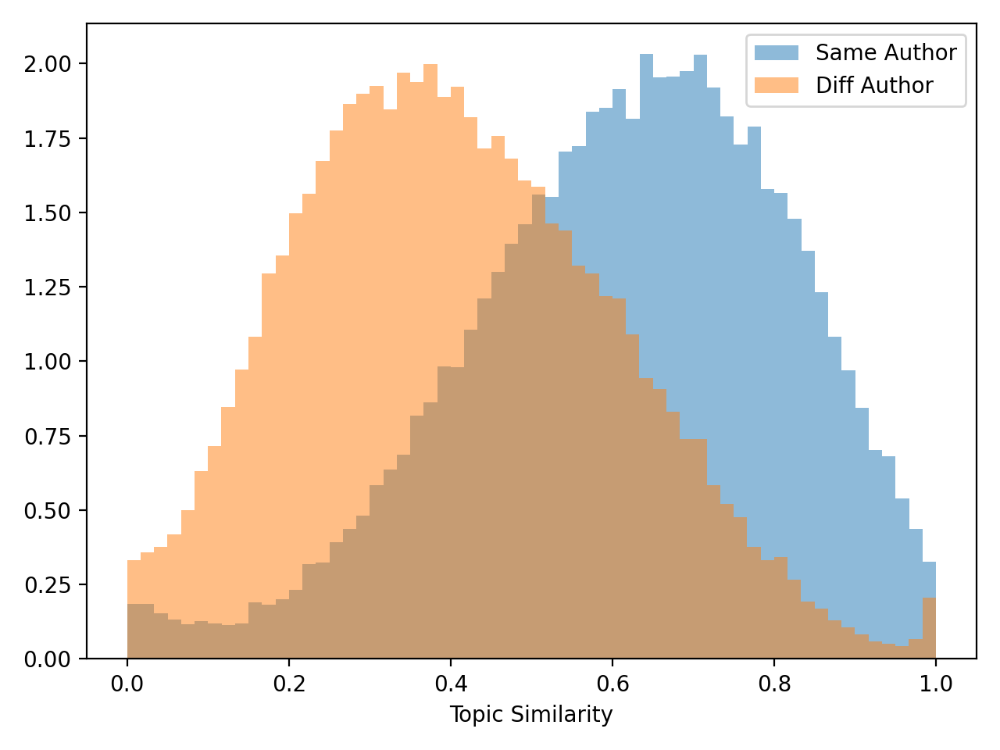

In [15]:
fig, ax = plt.subplots()

ax.hist(similarities[Y_test==True], bins=60, alpha=0.5, density=True)
ax.hist(similarities[Y_test==False], bins=60, alpha=0.5, density=True)

ax.set_xlabel('Topic Similarity')

ax.legend(labels=['Same Author','Diff Author'], loc='best')
plt.tight_layout()

plt.show()

Analyse Misclassifications
===

In [45]:
'../temp_data/reddit/unchunked/

'../temp_data/reddit_old_dec/unchunked/'

In [69]:
with open(CLASSIFIER_MODEL_DIR + 'model_2.p', 'rb') as f:
    (clf_nc, transformer_nc, scaler_nc, secondary_scaler_nc) = pickle.load(f)
    
XX_nc = np.memmap('../temp_data/reddit/unchunked/XX_test_2.npy', dtype='float32', mode='r', shape=x_shape_test)

In [70]:
probs = []
for i, j in tqdm(X_idxs_test):
    p = clf_nc.predict_proba(secondary_scaler_nc.transform(np.abs(XX_nc[[i], :] - XX_nc[[j], :])))[0, 1]
    probs.append(p)
probs = np.array(probs)

In [26]:
with open(TEMP_DATA_PATH + 'topic_similarity_results.p', 'wb') as f:
    pickle.dump((
        similarities,
        Y_test,
        probs
        ), f)

In [71]:
TPs = np.logical_and(Y_test == True, probs >= 0.5)
FPs = np.logical_and(Y_test == False, probs >= 0.5)

TNs = np.logical_and(Y_test == False, probs < 0.5)
FNs = np.logical_and(Y_test == True, probs < 0.5)

In [72]:
fig = go.Figure()
fig.add_trace(go.Histogram(
        x=similarities[Y_test==False],
        name='Same Author, Diff topic',
        histnorm='probability'
    ))
fig.add_trace(go.Histogram(
        x=similarities[FPs],
        name='Same Author, Diff topic',
        histnorm='probability'
    ))
fig.show()

In [73]:
fig = go.Figure()
fig.add_trace(go.Histogram(
        x=similarities[Y_test==True],
        name='Same Author, Diff topic',
        histnorm='probability'
    ))
fig.add_trace(go.Histogram(
        x=similarities[FNs],
        name='Same Author, Diff topic',
        histnorm='probability'
    ))
fig.show()

In [76]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
TEXT_WIDTH = 7.0 
COL_WIDTH = (TEXT_WIDTH - 0.5)/2
HEIGHT = 3.0
WIDTH = 3
style.use('seaborn-whitegrid')

rcParams['font.family'] = 'serif'
rcParams['font.serif'] = [ 'Times New Roman', 'Times', 'DejaVu Serif',
 'Bitstream Vera Serif',
 'Computer Modern Roman',
 'New Century Schoolbook',
 'Century Schoolbook L',
 'Utopia',
 'ITC Bookman',
 'Bookman',
 'Nimbus Roman No9 L',
 'Palatino',
 'Charter',
 'serif']
rcParams['font.size']=7

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  

<IPython.core.display.Javascript object>


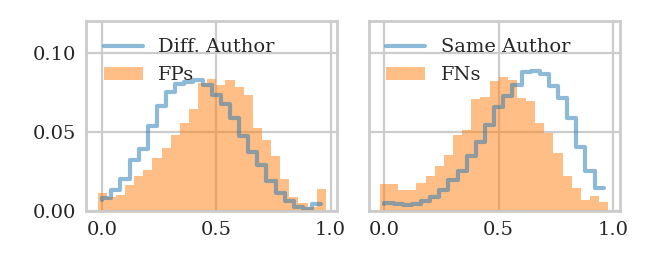

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(COL_WIDTH, 1.3), sharey=True)

nbins = 25
arr = similarities[Y_test==False]
results, edges = np.histogram(arr, density=True, bins=nbins)
binWidth = edges[1] - edges[0]
ax[0].step(edges[:-1], results * binWidth, binWidth, alpha=0.5, color=colors[0])

arr = similarities[FPs]
results, edges = np.histogram(arr, density=True, bins=nbins)
binWidth = edges[1] - edges[0]
ax[0].bar(edges[:-1], results * binWidth, binWidth, alpha=0.5,  color=colors[1])

legend_elements = [Line2D([0], [0], color=colors[0], label='Diff. Author', alpha=0.5),
                   Patch(facecolor=colors[1], label='FPs',alpha=0.5)]
ax[0].legend(handles=legend_elements, loc='upper left')


# ax[1].hist(similarities[labels==True], ec='blue', histtype='step', fc='none', bins=nbins, alpha=0.5, density=True)
# ax[1].hist(similarities[FNs], bins=nbins, alpha=0.5, density=True)
# # ax[1].set_xlabel('Topic sim. among FNs w.r.t all same author pairs')
# ax[1].legend(labels=['Same Author','FNs'], loc='upper left')

arr = similarities[Y_test==True]
results, edges = np.histogram(arr, density=True, bins=nbins)
binWidth = edges[1] - edges[0]
ax[1].step(edges[:-1], results * binWidth, binWidth, alpha=0.5, color=colors[0])

arr = similarities[FNs]
results, edges = np.histogram(arr, density=True, bins=nbins)
binWidth = edges[1] - edges[0]
ax[1].bar(edges[:-1], results * binWidth, binWidth, alpha=0.5,  color=colors[1])
legend_elements = [Line2D([0], [0], color=colors[0], label='Same Author', alpha=0.5),
                   Patch(facecolor=colors[1], label='FNs',alpha=0.5)]
ax[1].legend(handles=legend_elements, loc='upper left')



ax[0].set_ylim([0, .12])

plt.tight_layout()

plt.show()

plt.savefig(FIGURES_PATH + 'reddit_topic_similarity_small_new.pdf')

<IPython.core.display.Javascript object>


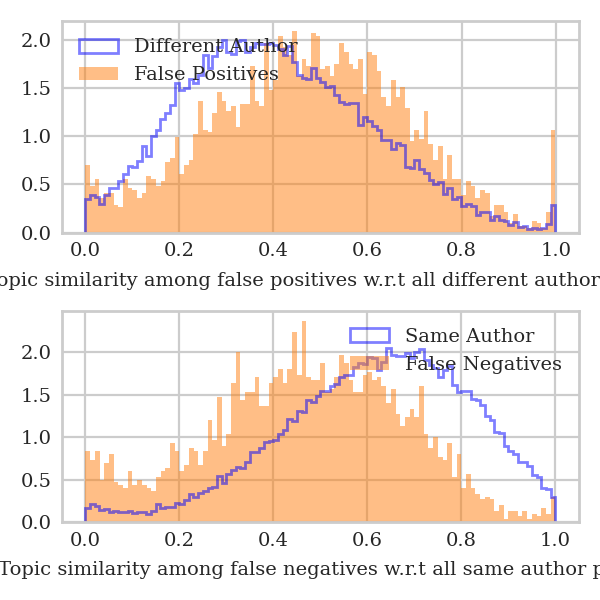

In [23]:
fig, ax = plt.subplots(2, 1, figsize=(WIDTH, HEIGHT))


ax[0].hist(similarities[Y_test==False], ec='blue', histtype='step', fc='none', bins=100, alpha=0.5, density=True)
ax[0].hist(similarities[FPs], bins=100, alpha=0.5, density=True)
ax[0].set_xlabel('Topic similarity among false positives w.r.t all different author pairs')
ax[0].legend(labels=['Different Author','False Positives'], loc='best')


ax[1].hist(similarities[Y_test==True], ec='blue', histtype='step', fc='none', bins=100, alpha=0.5, density=True)
ax[1].hist(similarities[FNs], bins=100, alpha=0.5, density=True)
ax[1].set_xlabel('Topic similarity among false negatives w.r.t all same author pairs')
ax[1].legend(labels=['Same Author','False Negatives'], loc='best')


plt.tight_layout()

plt.show()


plt.savefig(FIGURES_PATH + 'reddit_topic_similarity.pdf')

In [51]:
def compute_cohensd(X1, X2):
    X1_mean = X1.mean(axis=0)
    X2_mean = X2.mean(axis=0)
    # pos_std = X[Y==1].std(axis=0)
    # neg_std = X[Y==0].std(axis=0)
    # cd1 = 2 * (pos_mean - neg_mean) / (pos_std + neg_std)
#     std = np.std(np.concatenate([X1, X2]))
    std = np.sqrt((np.std(X1) ** 2 + np.std(X2) ** 2) / 2)
    # cd2 = (pos_mean - neg_mean) / std
    
    # print(cd1, cd2)
    return (X1_mean - X2_mean)/std

In [74]:
compute_cohensd(similarities[Y_test==True], similarities[FNs])

0.6924004369853591

In [75]:
compute_cohensd(similarities[Y_test==False], similarities[FPs])

-0.2937913889296343

<IPython.core.display.Javascript object>


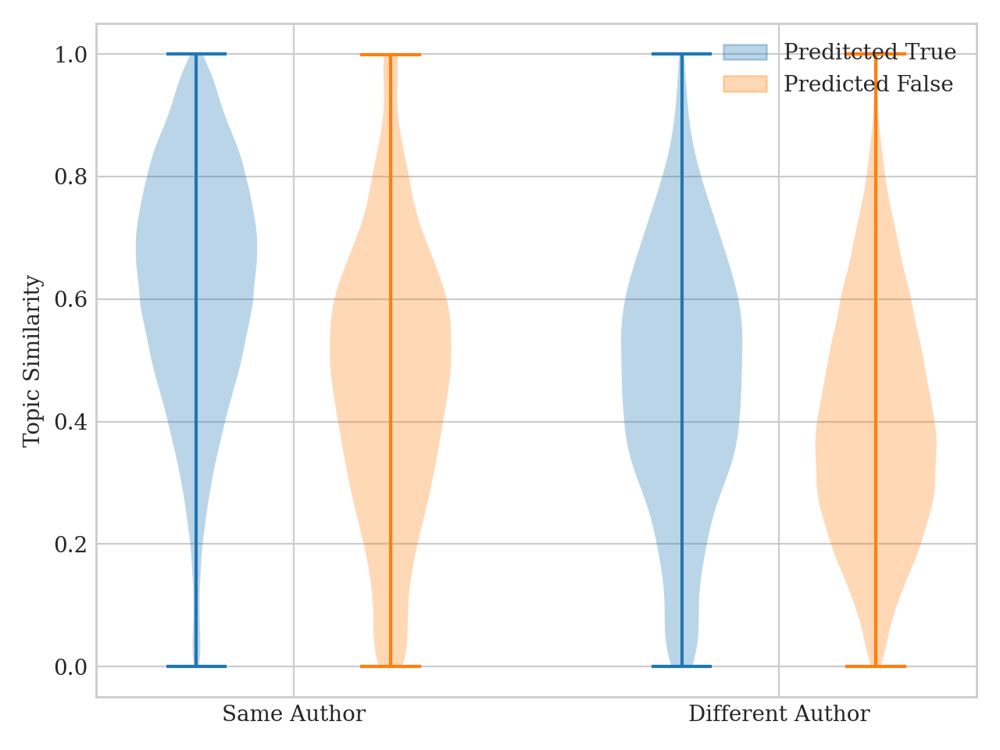

In [31]:
fig, ax = plt.subplots()

v1 = ax.violinplot([
    similarities[np.logical_and(probs > 0.5, Y_test==True)],
    similarities[np.logical_and(probs < 0.5, Y_test==True)],
], positions=[-0.4,  1.6 ])



v2 = ax.violinplot([
    similarities[np.logical_and(probs > 0.5, Y_test==False)],
    similarities[np.logical_and(probs < 0.5, Y_test==False)]
], positions=[0.4, 2.4])

colors = [mpatches.Patch(color=v1['bodies'][0].get_facecolor().flatten()), mpatches.Patch(color=v2['bodies'][0].get_facecolor().flatten())]
legend_names = ['Preditcted True', 'Predicted False']
plt.legend(colors, legend_names, loc='best')


plt.ylabel('Topic Similarity')
plt.xticks([0, 2], ['Same Author', 'Different Author'])
plt.tight_layout()
# tikzplotlib.save(FIGURES_PATH + 'violin_reddit_topic_similarity.pgf', axis_height='0.5\\textwidth')
# plt.savefig(FIGURES_PATH + 'violin_reddit_topic_similarity.png')